# Introduction <a id="introduction"></a>:
Accurate recognition and classification of fruits and vegetables is a critical task in various applications such as automated retail, smart agriculture, and inventory management. With the growing adoption of artificial intelligence and machine learning, deep learning models have demonstrated remarkable accuracy in image classification tasks. In this project, we aim to leverage state-of-the-art computer vision techniques to build a model capable of recognizing a diverse range of fruits and vegetables.

This project uses the **EfficientNetV2_B2** model, a highly efficient convolutional neural network known for its balance between accuracy and computational cost. We will utilize advanced image preprocessing and augmentation techniques such as **CutMix** and **MixUp** to enhance the generalization of the model. These methods ensure the model performs well on unseen data while preserving the intricate details of the various fruit and vegetable images.

# Problem Statement <a id="problem-statement"></a>:
The objective of this project is to develop a robust computer vision model that can accurately classify different types of fruits and vegetables from images. The challenge lies in ensuring the model generalizes well across variations in size, shape, color, and texture of the produce, which can vary significantly even within the same category. Furthermore, the model should be able to handle variations in lighting, backgrounds, and image quality.

By fine-tuning the **EfficientNetV2_B2** model on a well-curated dataset of fruits and vegetables, this project aims to achieve high accuracy while using advanced augmentation techniques like **CutMix** and **MixUp** to prevent overfitting and improve performance on complex visual patterns.

---

In [1]:
!nvidia-smi

Sun Sep 15 08:26:53 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.90.07              Driver Version: 550.90.07      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla P100-PCIE-16GB           Off |   00000000:00:04.0 Off |                    0 |
| N/A   39C    P0             27W /  250W |       0MiB /  16384MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

---

# Imports <a id="imports"></a>:

In [2]:
import os
os.environ["KERAS_BACKEND"] = "jax"

import shutil
import keras
import random
import keras_cv
import warnings
import numpy as np
import pandas as pd
from PIL import Image
import seaborn as sns
import tensorflow as tf
import keras.backend as K
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from keras.utils import image_dataset_from_directory

In [3]:
warnings.filterwarnings('ignore')

In [4]:
# Reproducability
tf.keras.utils.set_random_seed(73)

---

# Exploring the Working Directory <a id="exploring-the-working-directory"></a>:

The current structure of the `/kaggle/input/` directory is as follows:

- /kaggle/input/fruit-and-vegetable-image-recognition/

    - test/
        - apple/
            - image1.jpg
            - image2.jpg
            - ...
            
        - banana/
            - image1.JPG
            - image2.jpg
            - ...
            
        - ...
    
    - train/
        - apple/
            - image1.jpg
            - image2.jpg
            - ...
            
        - banana/
            - image1.JPG
            - image2.jpg
            - ...
            
        - ...
    
    - validation/
        - apple/
            - image1.jpg
            - image2.jpg
            - ...
            
        - banana/
            - image1.JPG
            - image2.jpg
            - ...
            
        - ...

As you can see that the images are already properly organized into train, test and validation directories.

### Getting the paths to Train, Test and Validation directories:

In [5]:
for root, _, _ in os.walk('/kaggle/input/'):
    if root.split('/')[-1] == 'train':
        train_dir = root
    elif root.split('/')[-1] == 'validation':
        valid_dir = root
    elif root.split('/')[-1] == 'test':
        test_dir = root

print(f"Train directory = {train_dir}\n\nValidation directory = {valid_dir}\n\nTest directory = {test_dir}")

Train directory = /kaggle/input/fruit-and-vegetable-image-recognition/train

Validation directory = /kaggle/input/fruit-and-vegetable-image-recognition/validation

Test directory = /kaggle/input/fruit-and-vegetable-image-recognition/test


### Getting the subdirectory paths within Train, Test and Validation directories:

* **NOTE:** We will require the subdirectory paths for data visualization later on in this notebook.

In [6]:
def get_sub_dirs(directory_path, directory_type):
    sub_dirs = []
    for root, _, _ in os.walk(directory_path):
        if directory_type not in root.split('/')[-1]:
            sub_dirs.append(root)
    sub_dirs.sort()
    return sub_dirs

In [7]:
train_sub_dirs = get_sub_dirs(train_dir, 'train')
train_sub_dirs[:5]

['/kaggle/input/fruit-and-vegetable-image-recognition/train/apple',
 '/kaggle/input/fruit-and-vegetable-image-recognition/train/banana',
 '/kaggle/input/fruit-and-vegetable-image-recognition/train/beetroot',
 '/kaggle/input/fruit-and-vegetable-image-recognition/train/bell pepper',
 '/kaggle/input/fruit-and-vegetable-image-recognition/train/cabbage']

In [8]:
valid_sub_dirs = get_sub_dirs(valid_dir, 'validation')
valid_sub_dirs[:5]

['/kaggle/input/fruit-and-vegetable-image-recognition/validation/apple',
 '/kaggle/input/fruit-and-vegetable-image-recognition/validation/banana',
 '/kaggle/input/fruit-and-vegetable-image-recognition/validation/beetroot',
 '/kaggle/input/fruit-and-vegetable-image-recognition/validation/bell pepper',
 '/kaggle/input/fruit-and-vegetable-image-recognition/validation/cabbage']

In [9]:
test_sub_dirs = get_sub_dirs(test_dir, 'test')
test_sub_dirs[:5]

['/kaggle/input/fruit-and-vegetable-image-recognition/test/apple',
 '/kaggle/input/fruit-and-vegetable-image-recognition/test/banana',
 '/kaggle/input/fruit-and-vegetable-image-recognition/test/beetroot',
 '/kaggle/input/fruit-and-vegetable-image-recognition/test/bell pepper',
 '/kaggle/input/fruit-and-vegetable-image-recognition/test/cabbage']

---

# EDA <a id="EDA"></a>:

In [10]:
def plot_df(sub_dirs_list, title=None):
    '''
    This function plots the number of images from each category present in a directory.
    '''
    
    categories = [x.split('/')[-1] for x in sub_dirs_list]
    num_total = [len(os.listdir(path)) for path in sub_dirs_list]
    
    num_img_df = pd.DataFrame.from_dict(
        {
            'categories': categories,
            'num_images': num_total
        }
    )
    num_img_df = num_img_df.sort_values(by='num_images')
    
    plt.figure(figsize=(12, 6), dpi=150)
    plt.title(title)
    plt.xticks(rotation=90)
    ax = sns.barplot(num_img_df, x='categories', y='num_images')
    ax.bar_label(ax.containers[0], fontsize=10);

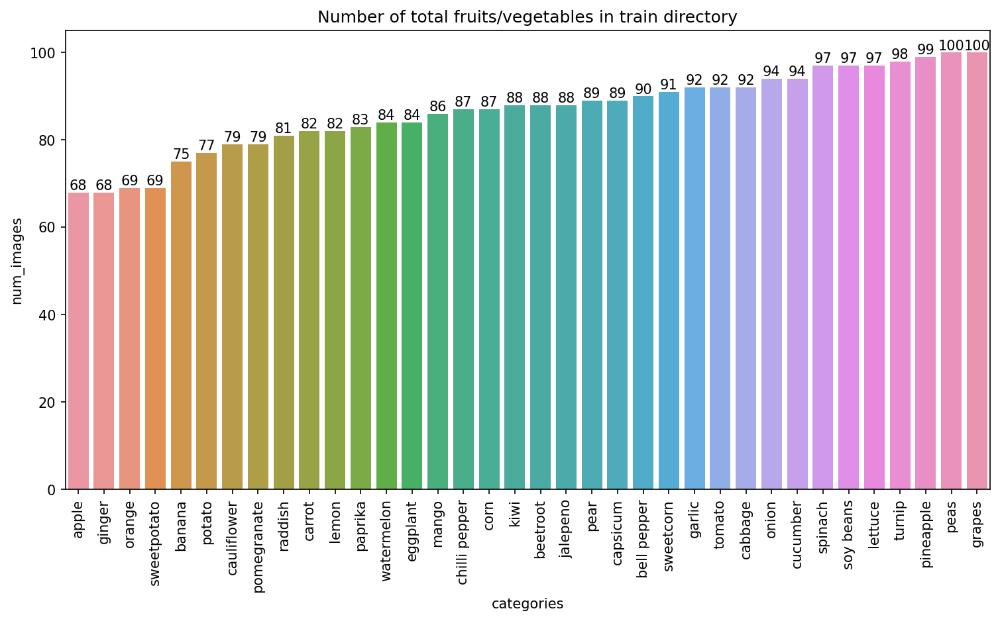

In [11]:
plot_df(train_sub_dirs, title='Number of total fruits/vegetables in train directory')

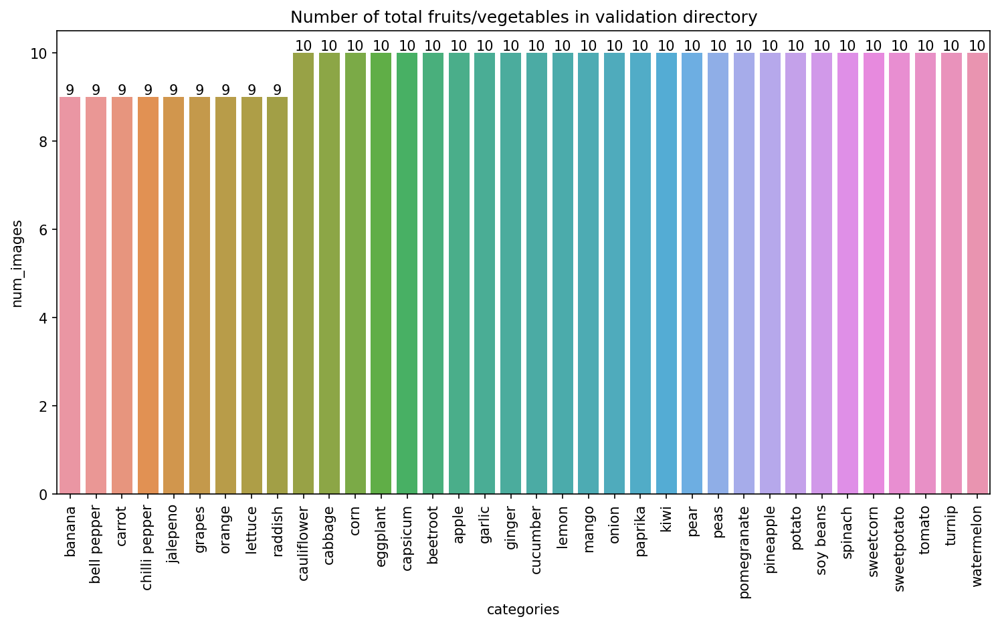

In [12]:
plot_df(valid_sub_dirs, title='Number of total fruits/vegetables in validation directory')

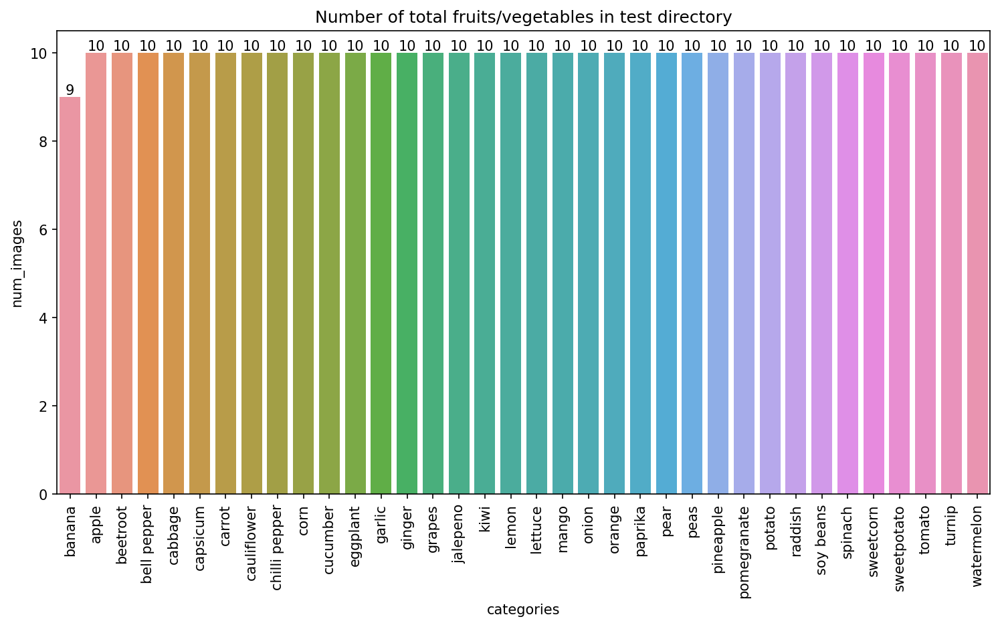

In [13]:
plot_df(test_sub_dirs, title='Number of total fruits/vegetables in test directory')

**We will now view two random images of each category from the training dirtectory**

In [14]:
# Function for plotting 2 random images from a folder
def plot_random_images_from_directory(directory_path):
    all_files = os.listdir(directory_path) 
    if len(all_files) < 4:
        print("Not enough images in the directory to display.")
        return
    selected_images = random.sample(all_files, 2)
    fig, axes = plt.subplots(1, 2, figsize=(4, 4), dpi=100)
    for i, ax in enumerate(axes.flat):
        image_path = os.path.join(directory_path, selected_images[i])
        img = mpimg.imread(image_path)
        ax.imshow(img)
        ax.axis('off')
    class_name = os.path.basename(directory_path)
    fig.suptitle(class_name, fontsize=16)
    plt.tight_layout()
    plt.show()

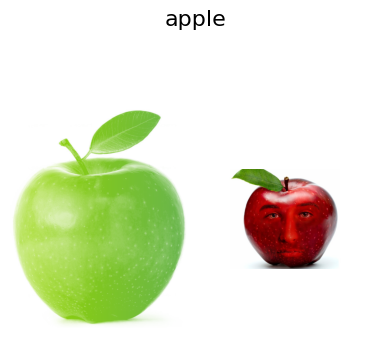

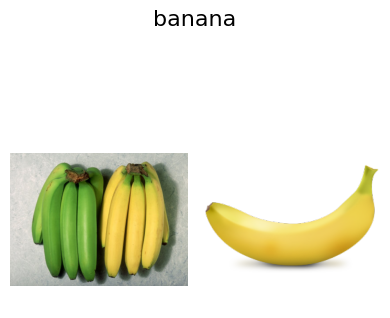

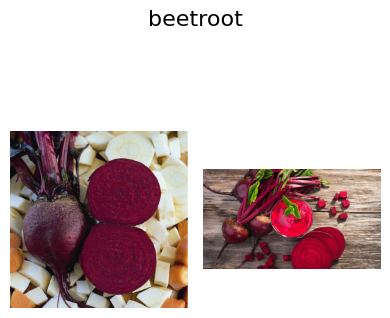

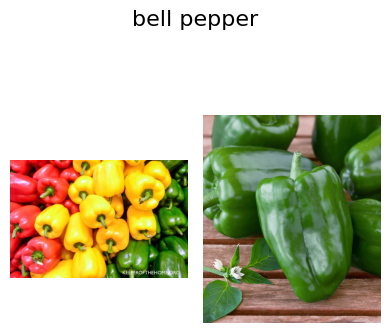

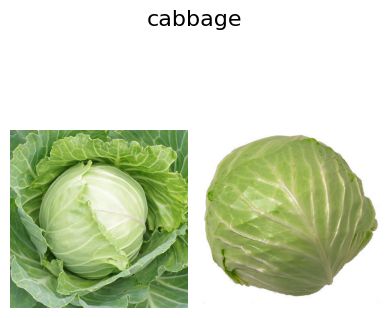

...

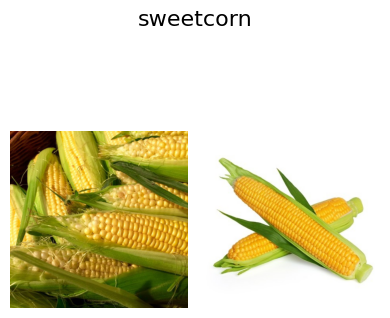

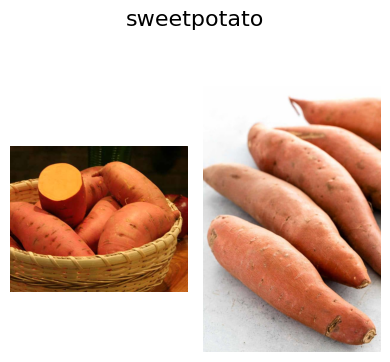

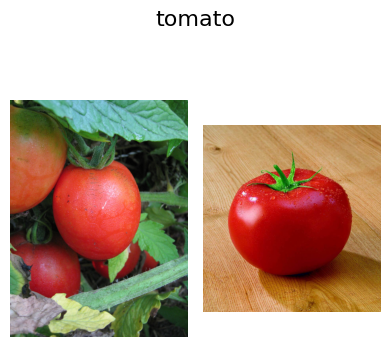

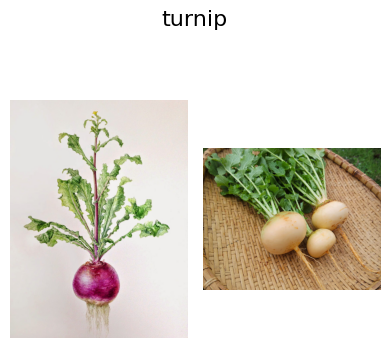

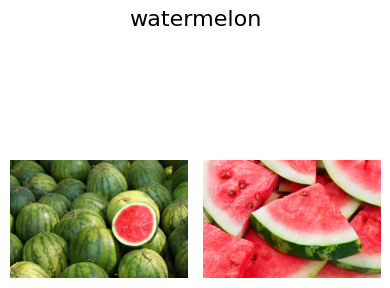

In [15]:
for directory in train_sub_dirs:
    plot_random_images_from_directory(directory)

* We will now write a function, which given a list of directories, will output a dictionary where the keys will represent the type of color channel and the corressponding value will be the number of images with that particular color channel in all those directories.

In [16]:
def count_color_channels(folder_paths):
    channel_counts = {}
    for folder_path in folder_paths:
        for file_name in os.listdir(folder_path):
            file_path = os.path.join(folder_path, file_name)
            try:
                with Image.open(file_path) as img:
                    mode = img.mode
                    if mode is not None:
                        if mode in channel_counts:
                            channel_counts[mode] += 1
                        else:
                            channel_counts[mode] = 1
                    else:
                        print(f"Unrecognized mode {mode} for file {file_path}")
            except Exception as e:
                print(f"Error processing file {file_path}: {e}")
    
    print(channel_counts)

In [17]:
count_color_channels(train_sub_dirs)

{'RGB': 2935, 'RGBA': 151, 'P': 24, 'CMYK': 5}


* We can see that most of the images in our training directory has the RGB color channel. 
* So, we will write a preprocessing function that will preprocess the input images to have the RGB color channel before being fed into the model.

---

# Building Tensorflow Image Datasets <a id="building-tensorflow-image-datasets"></a>:

In [18]:
# Image preprocessing function to convert images to have the RGB color channel
def preprocess_image(image, label):
    image = tf.image.convert_image_dtype(image, tf.float32) 
    if image.shape[-1] != 3:
        image = tf.image.grayscale_to_rgb(image) if image.shape[-1] == 1 else image[..., :3] 
    return image, label

In [19]:
def build_img_dataset(directory, BATCH_SIZE=32, SEED=101, IMG_SIZE=(224, 224), class_names=False, shuffle=True):
    dataset = tf.keras.preprocessing.image_dataset_from_directory(
        directory=directory,
        batch_size=BATCH_SIZE,
        label_mode='categorical',
        image_size=IMG_SIZE,
        interpolation='bilinear',
        shuffle=shuffle,
        seed=SEED
    )
    
    class_names = dataset.class_names
    
    dataset = dataset.map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE).cache().prefetch(tf.data.AUTOTUNE)
    
    return (dataset, class_names if class_names else None)

In [20]:
train_data = build_img_dataset(train_dir)[0]
valid_data = build_img_dataset(valid_dir)[0]
test_data, test_classes = build_img_dataset(test_dir, class_names=True) # will need test_classes in visualizing predictions

Found 3115 files belonging to 36 classes.
Found 351 files belonging to 36 classes.
Found 359 files belonging to 36 classes.


---

# Image Augmentations <a id="image-augmentations"></a>:

Data augmentation is a technique to make your model robust to changes in input data such as lighting, cropping, and orientation. One caveat to be aware of with image data augmentation is that you must be careful to not shift your augmented data distribution too far from the original data distribution. The goal is to prevent overfitting and increase generalization, but samples that lie completely out of the data distribution simply add noise to the training process.


[[source]](https://keras.io/guides/keras_cv/classification_with_keras_cv/)

In [21]:
def pack_to_dict(image, label):
    return {"images": image, "labels": label}

train_data = train_data.map(pack_to_dict, num_parallel_calls=tf.data.AUTOTUNE)

In [22]:
batch = next(iter(train_data.take(1)))
image_batch = batch["images"]
label_batch = batch["labels"]

def visualize_images(rows=2, cols=2, augmentation=None, images=image_batch):
    keras_cv.visualization.plot_image_gallery(
        augmentation(images) if augmentation else images,
        rows = rows,
        cols = cols,
        value_range = (0, 255),
        show = True,
    )

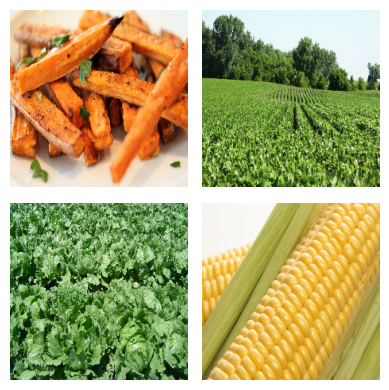

In [23]:
# Images before applying augmentation
visualize_images()

### RandomFlip Augmentation:

In [24]:
random_flip = keras_cv.layers.RandomFlip(
    mode = "horizontal_and_vertical"
)

augmenters = [random_flip]

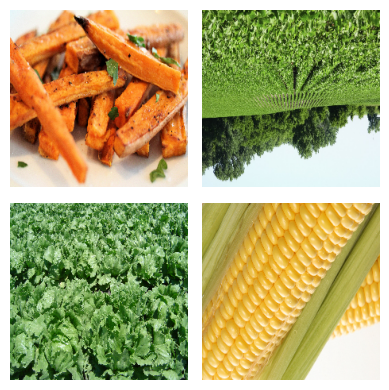

In [25]:
visualize_images(augmentation = random_flip)

### RandomCropAndeResize Augmentation:

The next augmentation we'll use is RandomCropAndResize. This operation selects a random subset of the image, then resizes it to the provided target size. By using this augmentation, we force our classifier to become spatially invariant. Additionally, this layer accepts an ```aspect_ratio_factor``` which can be used to distort the aspect ratio of the image. While this can improve model performance, it should be used with caution. It is very easy for an aspect ratio distortion to shift a sample too far from the original training set's data distribution. 


[[source]](https://keras.io/guides/keras_cv/classification_with_keras_cv/)

In [26]:
random_crop_and_resize = keras_cv.layers.RandomCropAndResize(
    target_size = (256, 256),
    crop_area_factor = (0.8, 1.0),
    aspect_ratio_factor = (0.9, 1.1),
)

augmenters += [random_crop_and_resize]

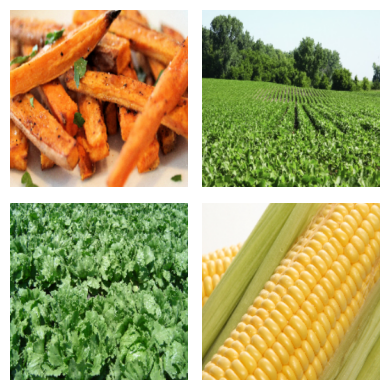

In [27]:
visualize_images(augmentation = random_crop_and_resize)

### RandomCutOut Augmentation:

This augmentation technique randomly cuts out rectangles from images and fill them.

In [28]:
random_cutout = keras_cv.layers.RandomCutout(
    height_factor = (0.5, 0.5),
    width_factor = (0.5, 0.5),
    fill_mode = 'gaussian_noise'
)

augmenters += [random_cutout]

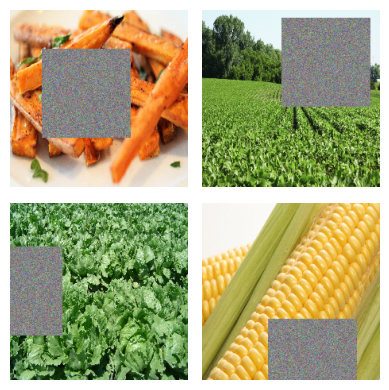

In [29]:
visualize_images(augmentation = random_cutout)

### RandAugment Augmentation:

```RandAugment``` is actually a set of 10 different augmentations: ```AutoContrast```, ```Equalize```, ```Solarize```, ```RandomColorJitter```, ```RandomContrast```, ```RandomBrightness```, ```ShearX```, ```ShearY```, ```TranslateX``` and ```TranslateY```. At inference time, ```num_augmentations``` augmenters are sampled for each image, and random magnitude factors are sampled for each. These augmentations are then applied sequentially.


[[source]](https://keras.io/guides/keras_cv/classification_with_keras_cv/)

In [30]:
rand_augment = keras_cv.layers.RandAugment(
    value_range = (0, 255),
    augmentations_per_image = 5,
    magnitude = 0,
    magnitude_stddev = 1,
    rate = 10/11,
)

augmenters += [rand_augment]

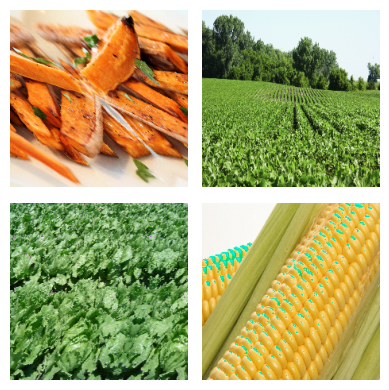

In [31]:
visualize_images(augmentation = rand_augment)

### CutMix Augmentation:

While the random cutouts of the ```RandomCutOut``` layer tackles the problem reasonably well, it can cause the classifier to develop responses to borders between features and the pixel areas caused by the cutout.

```CutMix``` solves the same issue by using a more complex (and more effective) technique. Instead of replacing the cut-out areas with random noise, ```CutMix``` replaces these regions with regions of other images sampled from within your training set! Following this replacement, the image's classification label is updated to be a blend of the original and mixed image's class label.

**NOTE:** ```CutMix``` needs to modify both images and labels


[[source]](https://keras.io/guides/keras_cv/classification_with_keras_cv/)

In [32]:
cut_mix = keras_cv.layers.CutMix()
inputs = {"images": image_batch, "labels": label_batch}

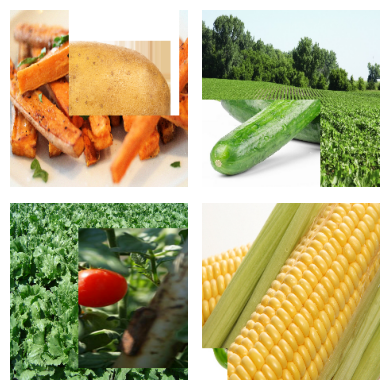

In [33]:
visualize_images(images = cut_mix(inputs)['images'])

### MixUp Augmentation:

```MixUp()``` works by sampling two images from a batch, then proceeding to literally blend together their pixel intensities as well as their classification labels.

**NOTE:** ```MixUp``` needs to modify both images and labels


[[source]](https://keras.io/guides/keras_cv/classification_with_keras_cv/)

In [34]:
mix_up = keras_cv.layers.MixUp(0.5)
inputs = {"images": image_batch, "labels": label_batch}

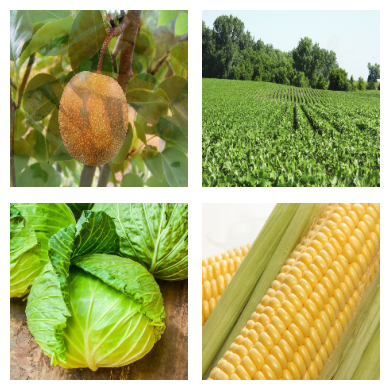

In [35]:
visualize_images(images = mix_up(inputs)['images'])

**Instead of applying ```CutMix()``` and ```MixUp()``` to every image, we will apply either of them to each batch. We will do this using ```keras_cv.layers.RandomChoice()```.**

In [36]:
cut_mix_or_mix_up = keras_cv.layers.RandomChoice(
    [cut_mix, mix_up], 
    batchwise = True
)
augmenters += [cut_mix_or_mix_up]

### Creating and applying the image augmentation function:

In [37]:
def create_augmenter_fn(augmenters):
    def augmenter_fn(inputs):
        for augmenter in augmenters:
            inputs = augmenter(inputs)
        return inputs
    return augmenter_fn

In [38]:
augmenter_fn = create_augmenter_fn(augmenters)
train_data = train_data.map(augmenter_fn, num_parallel_calls=tf.data.AUTOTUNE)

### Visualizing the augmented images:

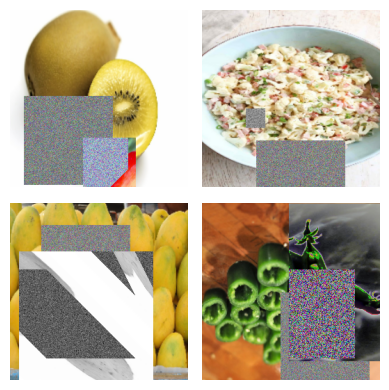

In [39]:
batch = next(iter(train_data.take(1)))
image_batch = batch["images"]
label_batch = batch["labels"]

visualize_images(images = image_batch)

In [40]:
def unpackage_dict(inputs):
    return inputs["images"], inputs["labels"]

train_data = train_data.map(unpackage_dict, num_parallel_calls=tf.data.AUTOTUNE)

---

# Model Building <a id="model-building"></a>:


We will fine tune the `EfficientNetV2_B2` model along with the pre-trained **imagenet** weights. This model is a variant of the **EfficientNetV2** family, known for its state-of-the-art performance in image classification tasks. Developed by **Google**, **EfficientNetV2** builds upon the original **EfficientNet** architecture, which introduced a novel compound scaling method to balance model depth, width, and resolution, achieving high accuracy with fewer parameters.

**EfficientNetV2** improves on this by focusing on faster training speeds and better accuracy, particularly on smaller datasets. It introduces a new scaling approach that optimizes both model size and training time, making it more suitable for practical applications. `EfficientNetV2_B2` is one of the intermediate models in the family, balancing size and accuracy. It has a relatively low number of parameters compared to larger variants, making it more efficient while still delivering high performance.

The model uses advanced building blocks such as Fused-MBConv layers, which combine depthwise convolutions and regular convolutions to improve efficiency. Additionally, **EfficientNetV2** incorporates progressive learning techniques, allowing it to scale effectively across datasets of varying sizes and complexities. Overall, `EfficientNetV2_B2` is an excellent choice for tasks requiring high accuracy with computational efficiency, making it ideal for applications like fruit and vegetable classification.

In [41]:
backbone = keras_cv.models.EfficientNetV2Backbone.from_preset(
    "efficientnetv2_b2_imagenet",
    load_weights=True,
)

model = keras.Sequential(
    [
        keras.layers.Input(shape=(None, None, 3)),
        keras.layers.Resizing(224, 224),
        backbone,
        keras.layers.GlobalAveragePooling2D(),
        keras.layers.Dense(len(test_classes), activation="softmax"),
    ]
)

In [42]:
model.compile(
    loss='categorical_crossentropy',
    optimizer=tf.keras.optimizers.AdamW(1e-4),
    metrics=['accuracy']
)

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing (Resizing)             │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficient_net_v2b2_backbone     │ (None, 7, 7, 1408)     │     8,769,374 │
│ (EfficientNetV2Backbone)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1408)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 36)             │        50,724 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,820,098 (33.65 MB)

 Trainable params: 8,737,810 (33.33 MB)

 Non-trainable params: 82,288 (321.44 KB)

---

# Model Training <a id="model-training"></a>:

In [43]:
earlystopping = keras.callbacks.EarlyStopping(
    monitor = 'val_loss',
    patience = 2,
    mode = 'min',
    min_delta = 0.01,
    verbose = 1,
    restore_best_weights = True
)

In [44]:
history = model.fit(
    train_data,
    epochs = 20,
    validation_data = valid_data,
    callbacks = [earlystopping],
)

Epoch 1/20
98/98 ━━━━━━━━━━━━━━━━━━━━ 186s 1s/step - accuracy: 0.0537 - loss: 3.5620 - val_accuracy: 0.4245 - val_loss: 3.1614
Epoch 2/20
98/98 ━━━━━━━━━━━━━━━━━━━━ 80s 571ms/step - accuracy: 0.2555 - loss: 3.2797 - val_accuracy: 0.6410 - val_loss: 2.1318
Epoch 3/20
98/98 ━━━━━━━━━━━━━━━━━━━━ 61s 580ms/step - accuracy: 0.3703 - loss: 2.8390 - val_accuracy: 0.7550 - val_loss: 1.3116
Epoch 4/20
98/98 ━━━━━━━━━━━━━━━━━━━━ 61s 577ms/step - accuracy: 0.4414 - loss: 2.4854 - val_accuracy: 0.7949 - val_loss: 0.9560
Epoch 5/20
98/98 ━━━━━━━━━━━━━━━━━━━━ 86s 829ms/step - accuracy: 0.5048 - loss: 2.2918 - val_accuracy: 0.7977 - val_loss: 0.7900
Epoch 6/20
98/98 ━━━━━━━━━━━━━━━━━━━━ 60s 569ms/step - accuracy: 0.5345 - loss: 2.1178 - val_accuracy: 0.8091 - val_loss: 0.6422
Epoch 7/20
98/98 ━━━━━━━━━━━━━━━━━━━━ 60s 567ms/step - accuracy: 0.5450 - loss: 2.0284 - val_accuracy: 0.8405 - val_loss: 0.5703
Epoch 8/20
98/98 ━━━━━━━━━━━━━━━━━━━━ 60s 566ms/step - accuracy: 0.5661 - loss: 1.9957 - val_accura

---

# Plotting Model Accuracy and Model Loss <a id="plotting-model-accuracy-and-model-loss"></a>:

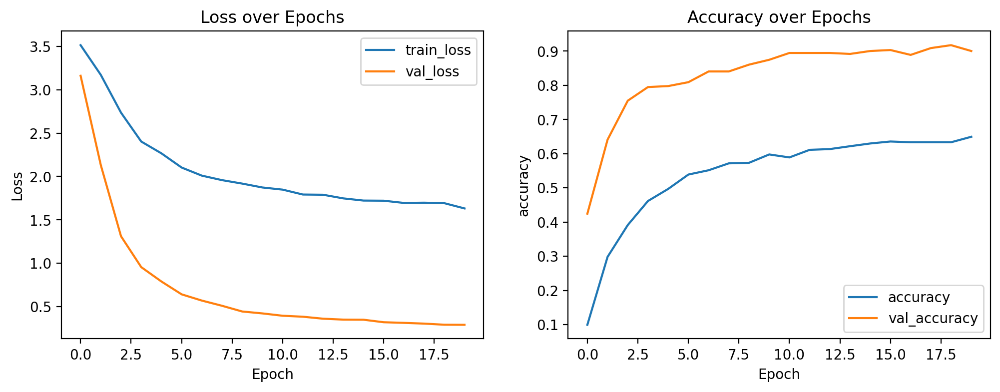

In [45]:
plt.figure(figsize=(12, 4), dpi=200)
# Plot loss
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss over Epochs')

# Plot accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('accuracy')
plt.legend()
plt.title('Accuracy over Epochs')

plt.show();

---

# Model Evaluation <a id="model-evaluation"></a>:

In [46]:
loss, accuracy = model.evaluate(test_data)
print(f"The model loss on the test dataset is {round(loss, 4)}.")
print(f"The model accuracy on the test dataset is {round(accuracy, 2)*100}%.")

12/12 ━━━━━━━━━━━━━━━━━━━━ 10s 517ms/step - accuracy: 0.9033 - loss: 0.2753
The model loss on the test dataset is 0.2919.
The model accuracy on the test dataset is 92.0%.


* We will now plot 9 random images from the test dataset along with their true and predcited labels
* If the predicted label matches the original label, the labels will be coloured in green, else, the labels will be coloured in red

In [47]:
# Function to display a grid of images with predictions and true labels
def display_images_with_predictions_and_true_labels(dataset, model, test_classes, num_images=9):
    plt.figure(figsize=(10, 10))

    # Take a batch from the dataset and select random images
    for images, labels in dataset.take(1):
        indices = np.random.choice(images.shape[0], num_images, replace=False)
        random_images = images.numpy()[indices]
        true_labels = labels.numpy()[indices]
        
        # Convert true labels to integer indices if they are one-hot encoded
        if len(true_labels.shape) > 1:
            true_labels = np.argmax(true_labels, axis=1)

        predictions = model.predict(random_images)
        predicted_labels = np.argmax(predictions, axis=1)

        for i in range(num_images):
            plt.subplot(3, 3, i + 1)
            plt.imshow(random_images[i].astype("uint8"))
            if true_labels[i] == predicted_labels[i]:
                color = 'green'
            else:
                color = 'red'
            plt.title(f"True: {test_classes[true_labels[i]]}\nPredicted: {test_classes[predicted_labels[i]]}",
                      color=color)
            plt.axis("off")

    plt.tight_layout()
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


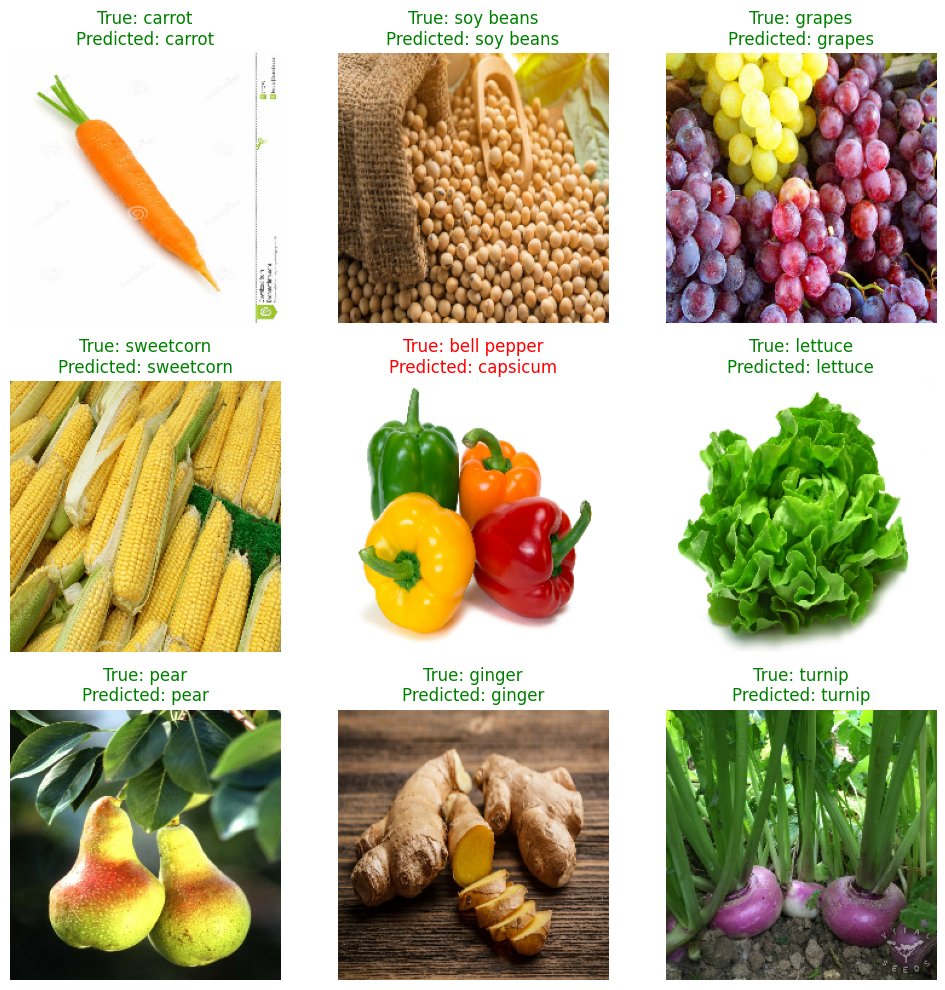

In [48]:
display_images_with_predictions_and_true_labels(test_data, model, test_classes)